In [1]:
%pylab nbagg
import mne
from robust_reference import robust_reference
from scipy import signal

Populating the interactive namespace from numpy and matplotlib


Extracting EDF parameters from D:\JHU\NDD\S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<IPython.core.display.Javascript object>


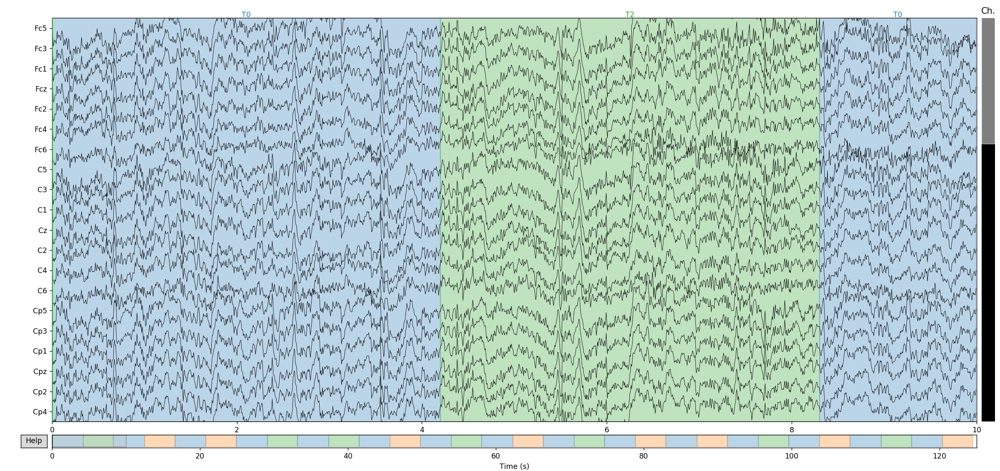

<IPython.core.display.Javascript object>


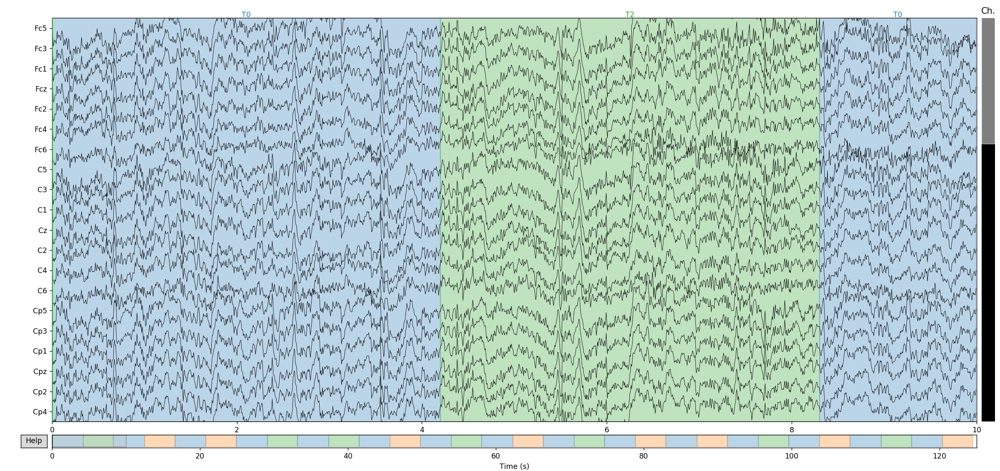

In [2]:
raw = mne.io.read_raw_edf("D:/JHU/NDD/S001R04.edf", preload=True)
raw.rename_channels(lambda s: s.strip("."))
ch_names = raw.info['ch_names']
raw.plot(scalings=dict(eeg=5e-5))

raw data plot

In [3]:
# Set PREP parameters
prep_params = {'ref_chs': ch_names, 'eval_chs': ch_names,
               'reref_chs': ch_names, 'line_freqs': 60}

# Set montage
montage_kind = "standard_1020"
montage = mne.channels.read_montage(
    kind=montage_kind, ch_names=raw.info["ch_names"])
mne.set_log_level("WARNING")
raw.set_montage(montage)

<RawEDF  |  S001R04.edf, n_channels x n_times : 64 x 20000 (125.0 sec), ~9.9 MB, data loaded>

<IPython.core.display.Javascript object>


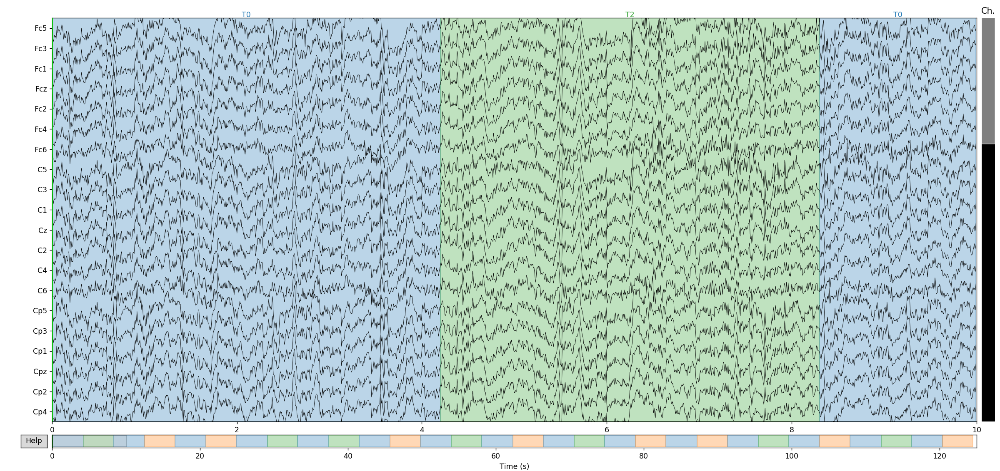

<IPython.core.display.Javascript object>


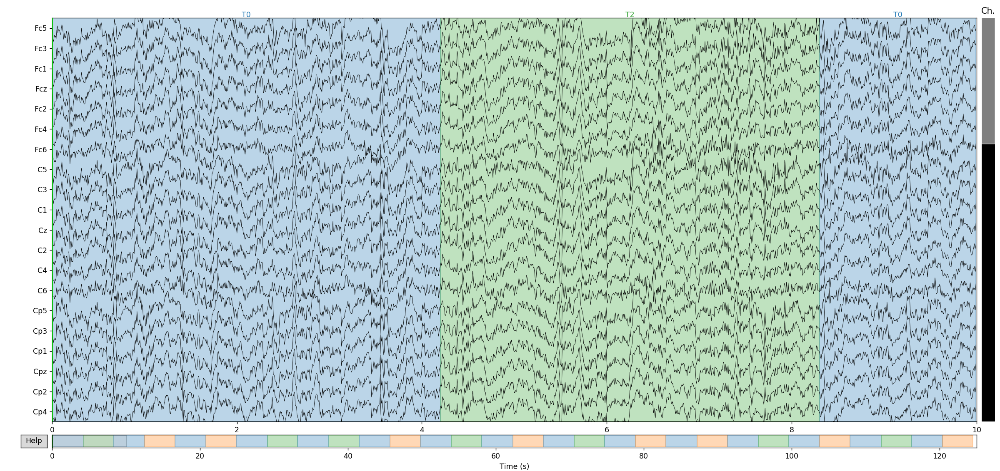

In [4]:
EEGData = raw.get_data(picks='eeg')
ch_names_original = raw.info["ch_names"]
sample_rate = raw.info["sfreq"]

# 1Hz high pass filtering
EEGData = mne.filter.filter_data(EEGData, sample_rate, 1, None, picks=None,
                       filter_length="auto", l_trans_bandwidth="auto",
                       h_trans_bandwidth="auto", n_jobs=1,
                       method="fir", iir_params=None,
                       copy=True, phase="zero", fir_window="hamming",
                       fir_design="firwin", pad="reflect_limited",
                       verbose=None)
raw._data = EEGData
raw.plot(scalings=dict(eeg=5e-5))

Singnal becomes smooth after high-pass filtering

<IPython.core.display.Javascript object>


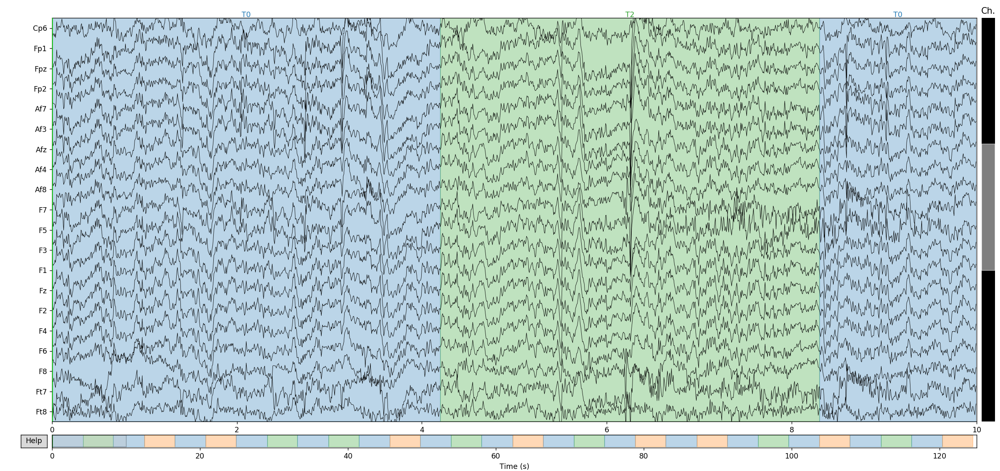

<IPython.core.display.Javascript object>


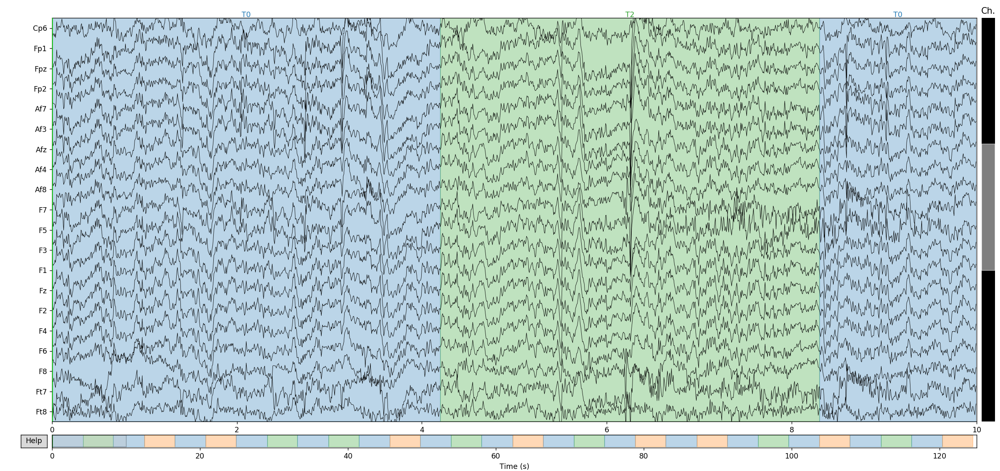

In [5]:
# removing line noise
linenoise = prep_params['line_freqs']
EEGData = mne.filter.notch_filter(EEGData, sample_rate, linenoise, filter_length="auto",
                        notch_widths=None, trans_bandwidth=1, method="fir",
                        iir_params=None, mt_bandwidth=None,
                        p_value=0.05, picks=None, n_jobs=1, copy=True, phase="zero",
                        fir_window="hamming", fir_design="firwin", pad="reflect_limited",
                        verbose=None)
raw._data = EEGData
raw.plot(scalings=dict(eeg=5e-5))

No significant change after removing line noise

2019-11-15 02:33:09,551 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['T10'], 'bad_by_hf_noise': ['T8', 'T10', 'Tp8'], 'bad_by_correlation': ['T10'], 'bad_by_dropout': [], 'bad_by_ransac': ['T10'], 'bad_all': ['T8', 'T10', 'Tp8']}
2019-11-15 02:33:12,727 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['T10'], 'bad_by_hf_noise': ['T8', 'T10', 'Tp8'], 'bad_by_correlation': ['T10', 'C2'], 'bad_by_dropout': [], 'bad_by_ransac': ['T10'], 'bad_all': ['T8', 'T10', 'Tp8', 'C2']}
2019-11-15 02:33:12,782 - robust_reference - INFO - Iterations: 1
2019-11-15 02:33:15,818 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['T10'], 'bad_by_hf_noise': ['T8', 'T10', 'Tp8'], 'bad_by_correlation': ['T10', 'C2'], 'bad_by_dropout': [], 'bad_by_ransac': ['T10'], 'bad_all': ['T8', 'T10', 'Tp8', 'C2']}
2019-11-15 02:33:15,868 - robust_reference - INFO - 

<IPython.core.display.Javascript object>


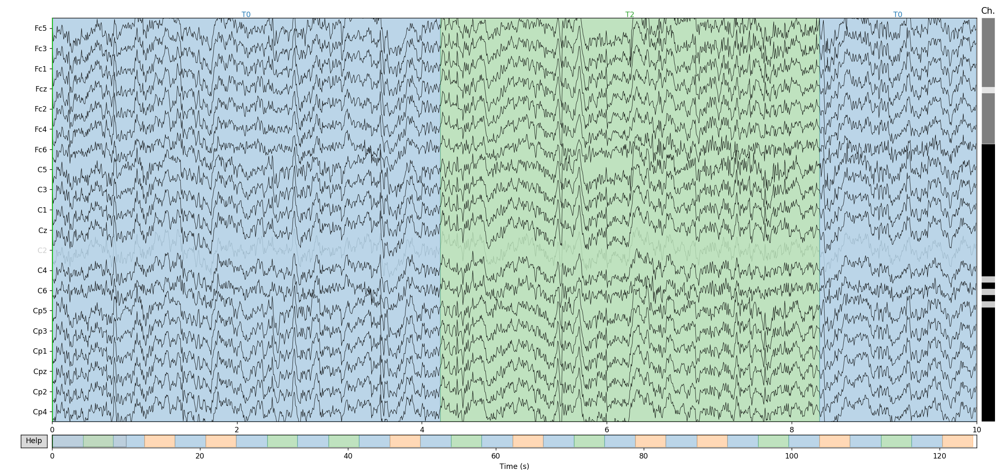

<IPython.core.display.Javascript object>


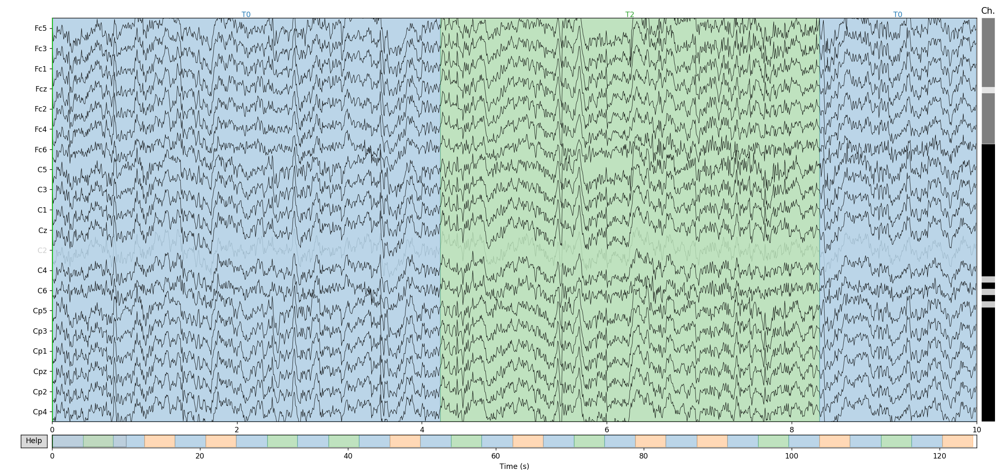

In [6]:
# Detect bad channels with robust Referencing
noisy_channels = robust_reference(raw, prep_params)
raw.info['bads'] = noisy_channels['bad_all']
raw.plot(block=True, scalings=dict(eeg=5e-5))